In [1]:
using Plots
default(fmt=:png)

using ForwardDiff
using SymPy

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
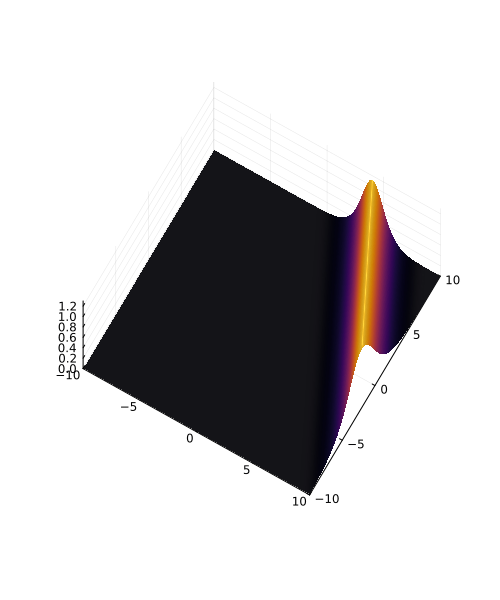

In [2]:
sol1(x, y, t; u=1, v=0, c=0) = (u-v)^2/2 * 1/cosh((c + (u-v)*x + (u^2-v^2)*y + (u^3-v^3)*t)/2)^2

xs = range(-10, 10, 100)
ys = range(-10, 10, 100)

@gif for t in range(-12, 12, 100)
    surface(xs, ys, (x,y)->sol1(x,y,t; v=-0.5); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
    plot!(zlim=(0, 1.3))
end

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
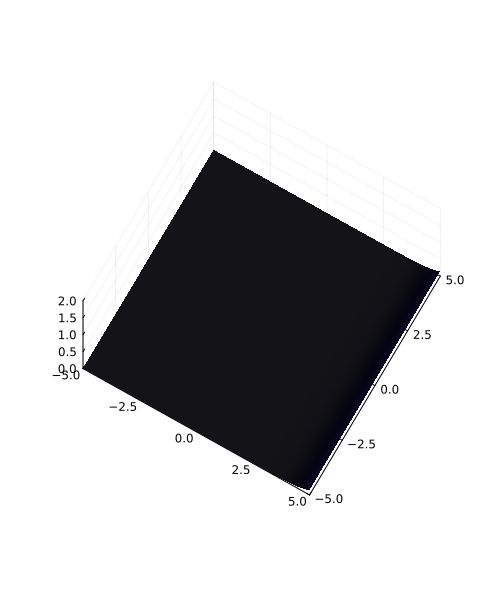

In [3]:
xs = range(-5, 5, 100)
ys = range(-5, 5, 100)

@gif for t in range(-7, 7, 100)
    surface(xs, ys, (x,y)->sol1(x,y,t; v=-1); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
    plot!(zlim=(0, 2))
end

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
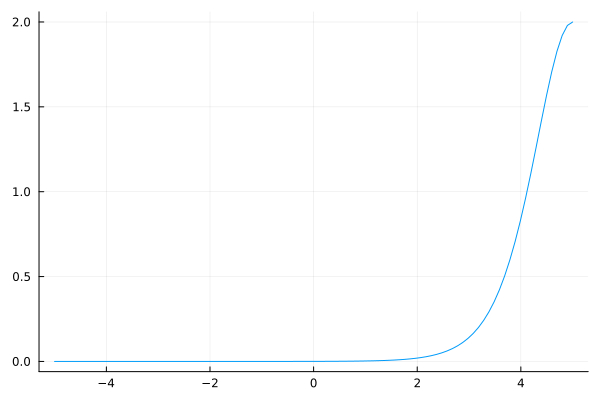

In [4]:
xs = range(-5, 5, 100)

@gif for t in range(-5, 5, 100)
    plot(xs, x->sol1(x,0,t; v=-1); label="")
end

In [5]:
tau1(x, y, t; u=1, v=0, c=0) = 1 + exp(c + (u-v)*x + (u^2-v^2)*y + (u^3-v^3)*t)

@syms x y t u v c

tau1(x, y, t; u, v, c) |>display

expr1 = 2SymPy.diff(log(tau1(x, y, t; u, v, c)), x, x) |> simplify
expr1 |> display

sol1(x, y, t; u, v, c)

       / 3    3\                 / 2    2\    
 c + t*\u  - v / + x*(u - v) + y*\u  - v /    
e                                          + 1

                            2                     
                     (u - v)                      
--------------------------------------------------
       /       3      3    2            2        \
      2|c   t*u    t*v    u *y   u*x   v *y   v*x|
2*cosh |- + ---- - ---- + ---- + --- - ---- - ---|
       \2    2      2      2      2     2      2 /

                            2                     
                     (u - v)                      
--------------------------------------------------
       /      / 3    3\                 / 2    2\\
      2|c   t*\u  - v /   x*(u - v)   y*\u  - v /|
2*cosh |- + ----------- + --------- + -----------|
       \2        2            2            2     /

  /                            2                                              
  |  / -t - x + y    t + x + y\    / -t - x + y    t + x + y\ / -t - x + y    
2*\- \e           - e         /  + \e           + e         /*\e           + e
------------------------------------------------------------------------------
                                                             2                
                               / -t - x + y    t + x + y    \                 
                               \e           + e          + 1/                 

              \
t + x + y    \|
          + 1//
---------------
               
               
               

"2*(-(exp(-t - x + y) - exp(t + x + y))^2 + (exp(-t - x + y) + exp(t + x + y))*(exp(-t - x + y) + exp(t + x + y) + 1))/(exp(-t - x + y) + exp(t + x + y) + 1)^2"

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
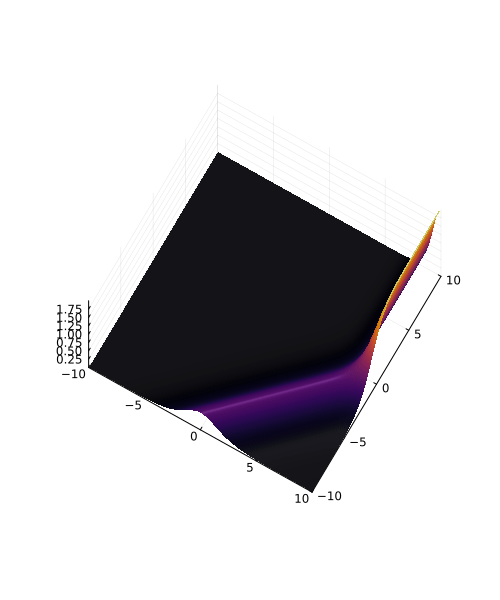

In [6]:
tau2(x, y, t; u1=1, v1=0, c1=0, u2=-1, v2=0, c2=0) = 1 + exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) + exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t) + (u1-u2)*(v1-v2)/((u1-v2)*(v1-u2)) * exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) * exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t)

@syms x y t

expr2 = 2SymPy.diff(log(tau2(x, y, t)), x, x) |> simplify
expr2 |> display

code2 = string(expr2)
code2 |> display

Meta.parse("sol2(x, y, t) = " * code2) |> eval

xs = range(-10, 10, 100)
ys = range(-10, 10, 100)

@gif for t in range(-10, 10, 100)
    surface(xs, ys, (x,y)->sol2(x,y,t); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
end

  /                                                                           
  |/      -0.343*t - 0.7*x + 0.49*y    t + x + y\ / -0.343*t - 0.7*x + 0.49*y 
2*\\0.49*e                          + e         /*\e                          
------------------------------------------------------------------------------
                                                                              
                                                  / -0.343*t - 0.7*x + 0.49*y 
                                                  \e                          

                                                                 2\
   t + x + y    \   /     -0.343*t - 0.7*x + 0.49*y    t + x + y\ |
+ e          + 1/ - \0.7*e                          - e         / /
-------------------------------------------------------------------
                 2                                                 
   t + x + y    \                                                  
+ e          + 1/                     

"2*((0.49*exp(-0.343*t - 0.7*x + 0.49*y) + exp(t + x + y))*(exp(-0.343*t - 0.7*x + 0.49*y) + exp(t + x + y) + 1) - (0.7*exp(-0.343*t - 0.7*x + 0.49*y) - exp(t + x + y))^2)/(exp(-0.343*t - 0.7*x + 0.49*y) + exp(t + x + y) + 1)^2"

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
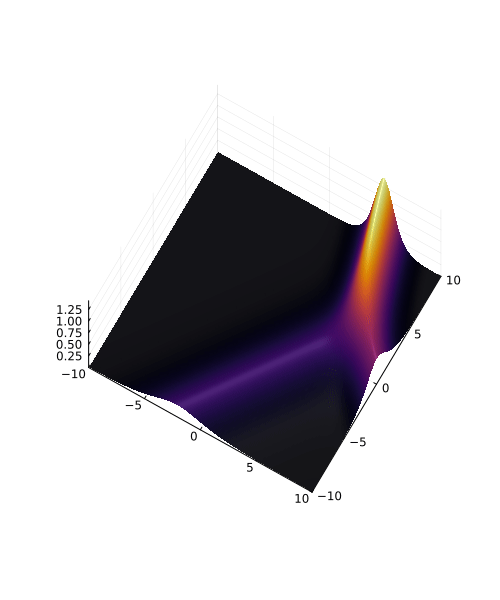

In [7]:
tau2(x, y, t; u1=1, v1=0, c1=0, u2=-0.7, v2=0, c2=0) = 1 + exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) + exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t) + (u1-u2)*(v1-v2)/((u1-v2)*(v1-u2)) * exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) * exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t)

@syms x y t

expr2 = 2SymPy.diff(log(tau2(x, y, t)), x, x) |> simplify
expr2 |> display

code2 = string(expr2)
code2 |> display

Meta.parse("sol2(x, y, t) = " * code2) |> eval

xs = range(-10, 10, 100)
ys = range(-10, 10, 100)

@gif for t in range(-10, 10, 100)
    surface(xs, ys, (x,y)->sol2(x,y,t); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
end

  /                                2                                          
  |  / -7*t - x - 3*y    t + x + y\    / -7*t - x - 3*y    t + x + y\ / -7*t -
2*\- \e               - e         /  + \e               + e         /*\e      
------------------------------------------------------------------------------
                                                                     2        
                                   / -7*t - x - 3*y    t + x + y    \         
                                   \e               + e          + 1/         

                          \
 x - 3*y    t + x + y    \|
         + e          + 1//
---------------------------
                           
                           
                           

"2*(-(exp(-7*t - x - 3*y) - exp(t + x + y))^2 + (exp(-7*t - x - 3*y) + exp(t + x + y))*(exp(-7*t - x - 3*y) + exp(t + x + y) + 1))/(exp(-7*t - x - 3*y) + exp(t + x + y) + 1)^2"

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
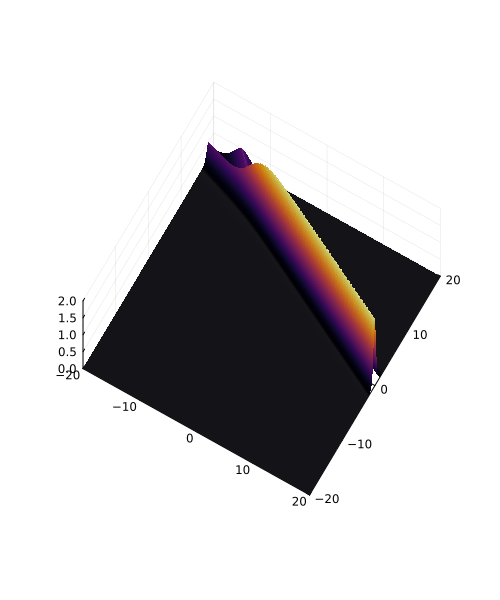

In [8]:
tau2(x, y, t; u1=1, v1=0, c1=0, u2=1, v2=2, c2=0) = 1 + exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) + exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t) + (u1-u2)*(v1-v2)/((u1-v2)*(v1-u2)) * exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) * exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t)

@syms x y t

expr2 = 2SymPy.diff(log(tau2(x, y, t)), x, x) |> simplify
expr2 |> display

code2 = string(expr2)
code2 |> display

Meta.parse("sol2(x, y, t) = " * code2) |> eval

xs = range(-20, 20, 200)
ys = range(-20, 20, 200)

@gif for t in range(-5, 5, 100)
    surface(xs, ys, (x,y)->sol2(x,y,t); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
    plot!(zlim=(0, 2))
end

                                                                              
       /                   2*t + 2*x    6.75*t + 3.0*x                       8
- 18.0*\0.666666666666667*e          + e               + 0.0666666666666667*e 
------------------------------------------------------------------------------
                                                                              
                                                                              
                                                                              

              2                                                               
.75*t + 5.0*x\      /   2*t + 2*x        6.75*t + 3.0*x        8.75*t + 5.0*x\
             /  + 2*\4*e          + 9.0*e               + 1.0*e              /
------------------------------------------------------------------------------
                                                         2                    
/ 2*t + 2*x    6.75*t + 3.0*x         8.75*t + 5.0*

"(-18.0*(0.666666666666667*exp(2*t + 2*x) + exp(6.75*t + 3.0*x) + 0.0666666666666667*exp(8.75*t + 5.0*x))^2 + 2*(4*exp(2*t + 2*x) + 9.0*exp(6.75*t + 3.0*x) + 1.0*exp(8.75*t + 5.0*x))*(exp(2*t + 2*x) + exp(6.75*t + 3.0*x) + 0.04*exp(8.75*t + 5.0*x) + 1))/(exp(2*t + 2*x) + exp(6.75*t + 3.0*x) + 0.04*exp(8.75*t + 5.0*x) + 1)^2"

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
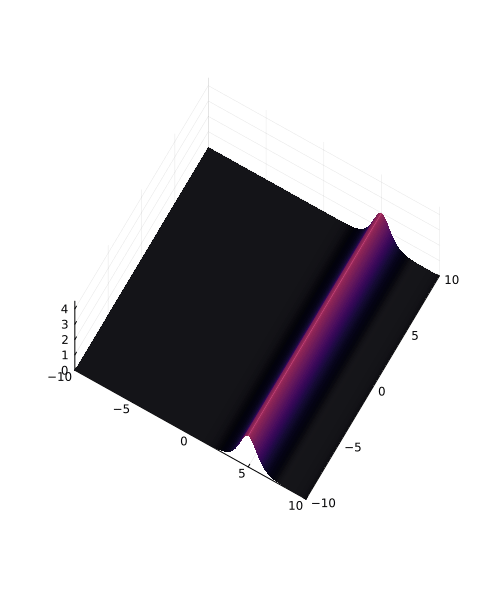

In [9]:
tau2(x, y, t; u1=1, v1=-1, c1=0, u2=1.5, v2=-1.5, c2=0) = 1 + exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) + exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t) + (u1-u2)*(v1-v2)/((u1-v2)*(v1-u2)) * exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) * exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t)

@syms x y t

expr2 = 2SymPy.diff(log(tau2(x, y, t)), x, x) |> simplify
expr2 |> display

code2 = string(expr2)
code2 |> display

Meta.parse("sol2(x, y, t) = " * code2) |> eval

xs = range(-10, 10, 200)
ys = range(-10, 10, 200)

@gif for t in range(-5, 5, 100)
    surface(xs, ys, (x,y)->sol2(x,y,t); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
    plot!(zlim=(0, 4.5))
end

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
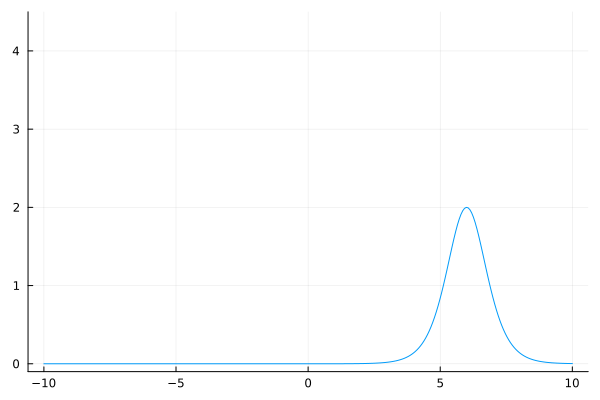

In [10]:
xs = range(-10, 10, 300)

@gif for t in range(-6, 6, 100)
    plot(xs, x->sol2(x,0,t); label="")
    plot!(ylim=(-0.1, 4.5))
end

                                                                              
        /                   2*t + 2*x    5.103*t + 2.7*x + 0.81*y             
- 14.58*\0.740740740740741*e          + e                         + 0.03164983
------------------------------------------------------------------------------
                                                                              
                                                                              
                                                                              

                                   2                                          
          7.103*t + 4.7*x + 0.81*y\      /   2*t + 2*x         5.103*t + 2.7*x
16498316*e                        /  + 2*\4*e          + 7.29*e               
------------------------------------------------------------------------------
                                                                              
                            / 2*t + 2*x    5.103*t 

"(-14.58*(0.740740740740741*exp(2*t + 2*x) + exp(5.103*t + 2.7*x + 0.81*y) + 0.0316498316498316*exp(7.103*t + 4.7*x + 0.81*y))^2 + 2*(4*exp(2*t + 2*x) + 7.29*exp(5.103*t + 2.7*x + 0.81*y) + 0.401636363636364*exp(7.103*t + 4.7*x + 0.81*y))*(exp(2*t + 2*x) + exp(5.103*t + 2.7*x + 0.81*y) + 0.0181818181818182*exp(7.103*t + 4.7*x + 0.81*y) + 1))/(exp(2*t + 2*x) + exp(5.103*t + 2.7*x + 0.81*y) + 0.0181818181818182*exp(7.103*t + 4.7*x + 0.81*y) + 1)^2"

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
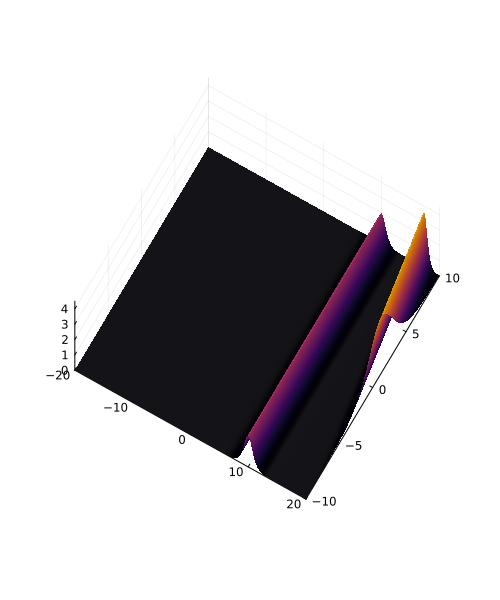

In [11]:
tau2(x, y, t; u1=1, v1=-1, c1=0, u2=1.5, v2=-1.2, c2=0) = 1 + exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) + exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t) + (u1-u2)*(v1-v2)/((u1-v2)*(v1-u2)) * exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) * exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t)

@syms x y t

expr2 = 2SymPy.diff(log(tau2(x, y, t)), x, x) |> simplify
expr2 |> display

code2 = string(expr2)
code2 |> display

Meta.parse("sol2(x, y, t) = " * code2) |> eval

xs = range(-20, 20, 200)
ys = range(-10, 10, 200)

@gif for t in range(-10, 10, 100)
    surface(xs, ys, (x,y)->sol2(x,y,t); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
    plot!(zlim=(0, 4.5))
end

"2*(-7.29*(0.0316498316498316*exp(2*t + 2*x)*exp(5.103*t + 2.7*x - 0.81*y) + 0.740740740740741*exp(2*t + 2*x) + exp(5.103*t + 2.7*x - 0.81*y))^2/(exp(2*(t + x)) + 0.0181818181818182*exp(2*t + 2*x)*exp(5.103*t + 2.7*x - 0.81*y) + exp(5.103*t + 2.7*x - 0.81*y) + 1) + 0.401636363636364*exp(2*t + 2*x)*exp(5.103*t + 2.7*x - 0.81*y) + 4*exp(2*t + 2*x) + 7.29*exp(5.103*t + 2.7*x - 0.81*y))/(exp(2*(t + x)) + 0.0181818181818182*exp(2*t + 2*x)*exp(5.103*t + 2.7*x - 0.81*y) + exp(5.103*t + 2.7*x - 0.81*y) + 1)"

[ Info: Saved animation to D:\OneDrive\public\0047\tmp.gif


Plots.AnimatedGif("D:\\OneDrive\\public\\0047\\tmp.gif")
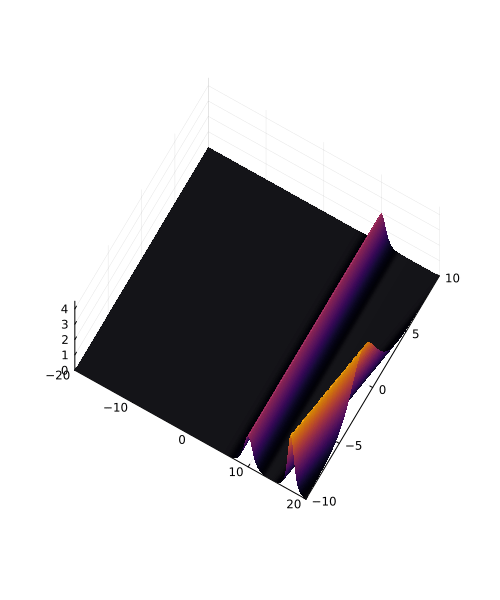

In [12]:
tau2(x, y, t; u1=1, v1=-1, c1=0, u2=1.2, v2=-1.5, c2=0) = 1 + exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) + exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t) + (u1-u2)*(v1-v2)/((u1-v2)*(v1-u2)) * exp(c1 + (u1-v1)*x + (u1^2-v1^2)*y + (u1^3-v1^3)*t) * exp(c2 + (u2-v2)*x + (u2^2-v2^2)*y + (u2^3-v2^3)*t)

@syms x y t

expr2 = 2SymPy.diff(log(tau2(x, y, t)), x, x) #|> simplify
#expr2 |> display

code2 = string(expr2)
code2 |> display

Meta.parse("sol2(x, y, t) = " * code2) |> eval

xs = range(-20, 20, 200)
ys = range(-10, 10, 200)

@gif for t in range(-10, 10, 100)
    surface(xs, ys, (x,y)->sol2(x,y,t); camera=(30, 75), colorbar=false)
    plot!(size=(500, 600))
    plot!(zlim=(0, 4.5))
end